<a href="https://colab.research.google.com/github/lsmanoel/BasicOfPython/blob/master/faceDatasetPreProcessing_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
!apt update
!apt install -y cmake
!pip install dlib

In [0]:
import os
import glob
import _pickle as cPickle
import numpy as np

import cv2
from matplotlib import pyplot as plt

import dlib
import tensorflow as tf

In [0]:
from google.colab import drive 
drive.mount('/content/gdrive')

---
# Face Dataset pre-processing

Is interesting feed a neural network with a regular dataset. 
Like Example in CNN aproach to face recognition, the face search with the selective search dlib.get_frontal_face_detector() of Dlib package and cv2.resize() of openCV may help us to generate a regular size feed dataset. The Examples below show like process the dataset.

**Automatic face cropper (single file):**

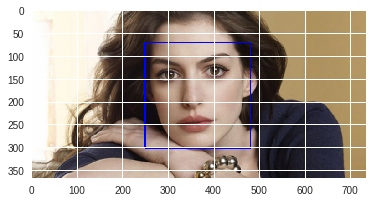

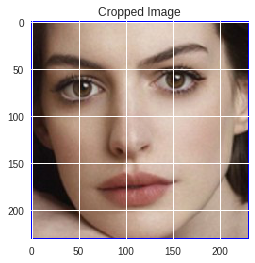

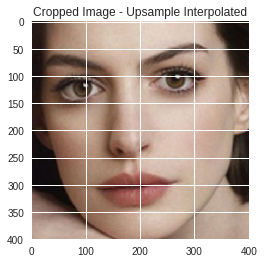

In [5]:
import cv2
from matplotlib import pyplot as plt
%matplotlib inline

frame = plt.imread("gdrive/My Drive/Colab Notebooks/face_detection/photos/faceDataset_1/Anne_Hathaway/Anne_Hathaway_face_12.jpg")  

faceDetector = dlib.get_frontal_face_detector()

#-----------------------------------------------------------------------------
#HOG STEP:
detectedFaces = faceDetector(frame, 2)

n_detectedFaces = 0
if len(detectedFaces) == 0:
  print("[WARNING] No face detected in file: ", file)
  plt.imshow(frame)
  plt.show()
else:    
  n_detectedFaces = n_detectedFaces + len(detectedFaces)
  for face in detectedFaces:
    left, top, right, bottom = (int(face.left()), 
                                int(face.top()), 
                                int(face.right()), 
                                int(face.bottom()))

    frame_cropped = frame[top:bottom, 
                          left:right]

    frame_cropped_resized = cv2.resize(frame_cropped, 
                                       (400, 400), 
                                       interpolation=cv2.INTER_CUBIC)
    cv2.rectangle(frame, 
                  (left, top), 
                  (right, bottom), 
                  (0, 0, 255), 
                  int(frame.shape[0]/150))


  plt.imshow(frame)
  plt.show()

  plt.imshow(frame_cropped)
  plt.title('Cropped Image')
  plt.show()

  plt.imshow(frame_cropped_resized)
  plt.title('Cropped Image - Upsample Interpolated')
  plt.show()     

Number of detected face:  4


/usr/local/lib/python3.6/dist-packages/matplotlib/figure.py:418: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


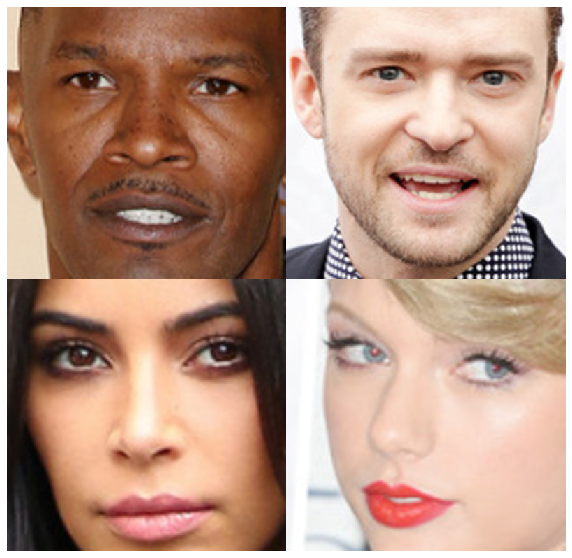

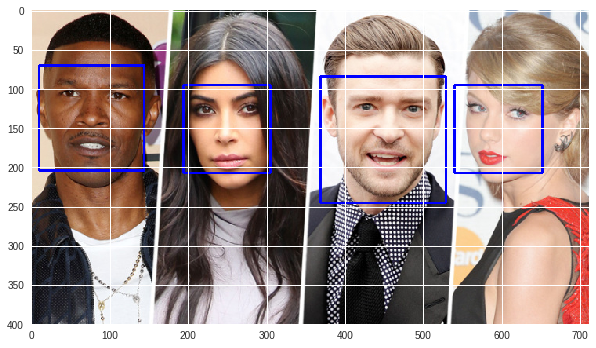

In [6]:
import cv2
from matplotlib import pyplot as plt
%matplotlib inline

frame = plt.imread("gdrive/My Drive/Colab Notebooks/datasets_image/peoples_dataset_1/peaples_17.jpg")  

faceDetector = dlib.get_frontal_face_detector()

#-----------------------------------------------------------------------------
#HOG STEP:
detectedFaces = faceDetector(frame, 2)

n_detectedFaces = 0
if len(detectedFaces) == 0:
  print("[WARNING] No face detected in file: ", file)
  plt.imshow(frame)
  plt.show()
else:
  print("Number of detected face: ", len(detectedFaces))
  n_detectedFaces = n_detectedFaces + len(detectedFaces)

  subplot_nrows = int(n_detectedFaces/2)+int(n_detectedFaces%2)
  subplot_ncols = 2

  fig = plt.figure(figsize=(10,5*subplot_nrows))
  ax = [fig.add_subplot(subplot_nrows, 
                        subplot_ncols, 
                        index+1) 
        for index in range(n_detectedFaces)]

  for index, face in enumerate(detectedFaces):
    left, top, right, bottom = (int(face.left()), 
                                int(face.top()), 
                                int(face.right()), 
                                int(face.bottom()))   

    frame_cropped = frame[top:bottom, 
                          left:right]

    frame_cropped_resized = cv2.resize(frame_cropped, 
                                       (400, 400), 
                                       interpolation=cv2.INTER_CUBIC)

    cv2.rectangle(frame, 
            (left, top), 
            (right, bottom), 
            (0, 0, 255), 
            int(frame.shape[0]/150))  

    ax[index].imshow(frame_cropped_resized)
    ax[index].grid(False)
    ax[index].set_xticklabels([])
    ax[index].set_yticklabels([])
    ax[index].set_aspect('auto')

  fig.subplots_adjust(wspace=0, hspace=0)
  fig.show()

  fig2 = plt.figure(figsize=(10,10))
  plt.imshow(frame)
  plt.show()

---
# Automatic Image Search :

In [0]:
# To process images of Anne Hathaway:
load_path = "gdrive/My Drive/Colab Notebooks/face_detection/photos/faceDataset_1/Anne_Hathaway"
save_path = "gdrive/My Drive/Colab Notebooks/face_detection/photos/faceDataset_1/Anne_Hathaway/face_cropped_dataset"
input_size = (360, 360)

In [0]:
# To process images different people:
load_path = "gdrive/My Drive/Colab Notebooks/datasets_image/peoples_dataset_1"
save_path = "gdrive/My Drive/Colab Notebooks/datasets_image/peoples_dataset_1/peaples_dataset1_faceCropped"
input_size = (300, 300)

**Automatic face cropper (dataset) - To Folder:**

In [37]:
import os
import glob
import cv2
import dlib

from matplotlib import pyplot as plt
%matplotlib inline

faceDetector = dlib.get_frontal_face_detector()

n_detectedFaces = 0
n_file = 0
n_crop = 0

print("Start face search... ")
print("---------------------------------------------------------------------------")
for n_file, file in enumerate(glob.glob(os.path.join(load_path, "*.jpg"))):
  frame = plt.imread(file)
  
  #-----------------------------------------------------------------------------
  #HOG STEP:
  detectedFaces = faceDetector(frame, 2)
  
  if len(detectedFaces) == 0:
    print("[WARNING] No face detected in file: ", file)
    
  else:
    file_name = file.split('/')
    file_name = file_name[-1]
    file_name = file_name.split('_')
    file_name = file_name[-2] + '_' + file_name[-1]   
    print("Scan file: {}\t[{}\t faces found]".format(file_name, len(detectedFaces)), end='')
    
    for n_crop, face in enumerate(detectedFaces):
      left, top, right, bottom = (int(face.left()), 
                                  int(face.top()), 
                                  int(face.right()), 
                                  int(face.bottom()))
     
      frame_cropped = frame[top:bottom, 
                            left:right]
      
      frame_cropped_resized = cv2.resize(frame_cropped,
                                         input_size, 
                                         interpolation=cv2.INTER_CUBIC)
      
      seveFileName = "peaples_faceCropped_" + str(n_detectedFaces+n_crop) + ".jpg" 
      plt.imsave(os.path.join(save_path, seveFileName), frame_cropped_resized);
      print('>', end='')
      
    n_detectedFaces = n_detectedFaces + len(detectedFaces) 
    
    print('|saved!')
print("---------------------------------------------------------------------------") 
print("{} faces found!".format(n_detectedFaces))  

Start face search... 
---------------------------------------------------------------------------
Scan file: peaples_24.jpg	[12	 faces found]>>>>>>>>>>>>|
Scan file: peaples_23.jpg	[8	 faces found]>>>>>>>>|
Scan file: peaples_34.jpg	[19	 faces found]>>>>>>>>>>>>>>>>>>>|
Scan file: peaples_25.jpg	[6	 faces found]>>>>>>|
Scan file: peaples_12.jpg	[24	 faces found]>>>>>>>>>>>>>>>>>>>>>>>>|
Scan file: peaples_11.jpg	[24	 faces found]>>>>>>>>>>>>>>>>>>>>>>>>|
Scan file: peaples_22.jpg	[11	 faces found]>>>>>>>>>>>|
Scan file: peaples_9.jpg	[20	 faces found]>>>>>>>>>>>>>>>>>>>>|
Scan file: peaples_2.jpg	[5	 faces found]>>>>>|
Scan file: peaples_28.jpg	[20	 faces found]>>>>>>>>>>>>>>>>>>>>|
Scan file: peaples_8.jpg	[10	 faces found]>>>>>>>>>>|
Scan file: peaples_7.jpg	[7	 faces found]>>>>>>>|
Scan file: peaples_17.jpg	[4	 faces found]>>>>|
Scan file: peaples_18.jpg	[21	 faces found]>>>>>>>>>>>>>>>>>>>>>|
Scan file: peaples_26.jpg	[17	 faces found]>>>>>>>>>>>>>>>>>|
Scan file: peaples_30.jpg	[3

**Automatic face cropper (dataset)** 

To List **frame_cropped_resized_list**

In [42]:
input_size = (100, 100)

import os
import glob
import cv2
from matplotlib import pyplot as plt
%matplotlib inline

n_detectedFaces = 0
n_file = 0
n_crop = 0
frame_cropped_resized_list = []

print("Start face search... ")
print("---------------------------------------------------------------------------")

for n_file, file in enumerate(glob.glob(os.path.join(load_path, "*.jpg"))):
  frame = plt.imread(file)
  
  #-----------------------------------------------------------------------------
  #HOG STEP:
  detectedFaces = faceDetector(frame, 2)
  
  if len(detectedFaces) == 0:
    print("[WARNING] No face detected in file: ", file)
    
  else:
    file_name = file.split('/')
    file_name = file_name[-1]
    file_name = file_name.split('_')
    file_name = file_name[-2] + '_' + file_name[-1]
    
    n_detectedFaces = n_detectedFaces + len(detectedFaces)
    
    print("Scan file: {}\t -> {}\t faces found".format(file_name, len(detectedFaces)))
    
    for n_crop, face in enumerate(detectedFaces):
      left, top, right, bottom = (int(face.left()), 
                                  int(face.top()), 
                                  int(face.right()), 
                                  int(face.bottom()))
     
      frame_cropped = frame[top:bottom, 
                            left:right]
      
      frame_cropped_resized = cv2.resize(frame_cropped,
                                         input_size, 
                                         interpolation=cv2.INTER_CUBIC)
      
      frame_cropped_resized_list.append((frame_cropped_resized, n_crop))

print("---------------------------------------------------------------------------") 
print("{} faces found!".format(n_detectedFaces))

Start face search... 
---------------------------------------------------------------------------
Scan file: peaples_24.jpg	 -> 12	 faces found
Scan file: peaples_23.jpg	 -> 8	 faces found
Scan file: peaples_34.jpg	 -> 19	 faces found
Scan file: peaples_25.jpg	 -> 6	 faces found
Scan file: peaples_12.jpg	 -> 24	 faces found
Scan file: peaples_11.jpg	 -> 24	 faces found
Scan file: peaples_22.jpg	 -> 11	 faces found
Scan file: peaples_9.jpg	 -> 20	 faces found
Scan file: peaples_2.jpg	 -> 5	 faces found
Scan file: peaples_28.jpg	 -> 20	 faces found
Scan file: peaples_8.jpg	 -> 10	 faces found
Scan file: peaples_7.jpg	 -> 7	 faces found
Scan file: peaples_17.jpg	 -> 4	 faces found
Scan file: peaples_18.jpg	 -> 21	 faces found
Scan file: peaples_26.jpg	 -> 17	 faces found
Scan file: peaples_30.jpg	 -> 3	 faces found
Scan file: peaples_1.jpg	 -> 18	 faces found
Scan file: peaples_4.jpg	 -> 6	 faces found
Scan file: peaples_21.jpg	 -> 24	 faces found
Scan file: peaples_5.jpg	 -> 3	 faces fou

In [44]:
print("{} list len!".format(len(frame_cropped_resized_list)))
print("{} faces found!".format(n_detectedFaces))
print("{} nrows".format(subplot_nrows))

449 list len!
449 faces found!
75 nrows


To see the all images in **frame_cropped_resized_list**:



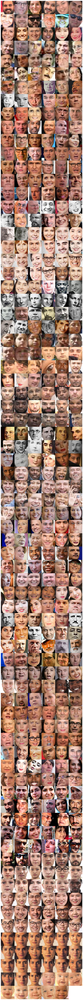

In [43]:
subplot_size = 2
subplot_ncols = 6
subplot_nrows = int(n_detectedFaces/subplot_ncols)+1

fig = plt.figure(figsize=(subplot_size*subplot_ncols, subplot_size*subplot_nrows))
ax = [fig.add_subplot(subplot_nrows, 
                      subplot_ncols, 
                      index+1) 
      for index in range(n_detectedFaces)]

for index, image in enumerate(frame_cropped_resized_list):
  ax[index].imshow(image[0])
  ax[index].grid(False)
  ax[index].set_xticklabels([])
  ax[index].set_yticklabels([])
  ax[index].set_aspect('auto')
  
fig.subplots_adjust(wspace=0, hspace=0)

---
#Load Dataset
Load dataset to a list of tuples to CNN application: (data, binary label)




In [45]:
lineSize = 75

import os
import glob
import cv2

from matplotlib import pyplot as plt
%matplotlib inline

load_path_true = "gdrive/My Drive/Colab Notebooks/face_detection/photos/faceDataset_1/Anne_Hathaway/face_cropped_dataset"
load_path_false = "gdrive/My Drive/Colab Notebooks/datasets_image/peoples_dataset_1/peaples_dataset1_faceCropped"

#===============================================================================
data_list_true = []
print("Start true face search... ")
print("---------------------------------------------------------------------------")
newLineSize = lineSize
for n_file, file in enumerate(glob.glob(os.path.join(load_path_true, "*.jpg"))):
#   file_name = file.split('/')
#   file_name = file_name[-1]
#   file_name = file_name.split('_')
#   file_name = file_name[-2] + '_' + file_name[-1]
#   print("Scan file: {}".format(file_name))

  if n_file+1 >= newLineSize:
    print('\n')
    newLineSize = newLineSize + lineSize
  else:   
    print('>', end='')
    
  frame = plt.imread(file)
  data_list_true.append((frame, 1.0))
print('\n')

print("---------------------------------------------------------------------------") 
print("{} true faces found!".format(n_file+1))
  
#===============================================================================
data_list_false = []
print("Start false face search... ")
print("---------------------------------------------------------------------------")
newLineSize = lineSize
for n_file, file in enumerate(glob.glob(os.path.join(load_path_false, "*.jpg"))):
#   file_name = file.split('/')
#   file_name = file_name[-1]
#   file_name = file_name.split('_')
#   file_name = file_name[-2] + '_' + file_name[-1]
#   print("Scan file: {}".format(file_name))

  if n_file+1 >= newLineSize:
    print('\n')
    newLineSize = newLineSize + lineSize
  else:   
    print('>', end='')
    
  frame = plt.imread(file)
  data_list_false.append((frame, 0.0))
print('\n')

print("---------------------------------------------------------------------------") 
print("{} false faces found!".format(n_file+1))
    

Start true face search... 
---------------------------------------------------------------------------
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>

---------------------------------------------------------------------------
49 true faces found!
Start false face search... 
---------------------------------------------------------------------------
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>

>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>

>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>

>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>

>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>

>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>

---------------------------------------------------------------------------
449 false faces found!
